In [1]:
import os
import pydicom
import numpy as np
import matplotlib.pyplot as plt
from concurrent.futures import ThreadPoolExecutor
from tqdm import tqdm

# Define the path to the root directory containing DICOM folders
dicom_root = '/gpfs/data/mankowskilab/HCC_Recurrence/dicom'

Matplotlib created a temporary cache directory at /tmp/matplotlib-18sv4lc3 because the default path (/gpfs/home/wz1492/.config/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


In [2]:
# Function to get all DICOM file paths
def get_dicom_files(root_dir):
    dicom_files = []
    for root, _, files in os.walk(root_dir):
        for file in sorted(files, key=lambda x: int(os.path.splitext(x)[0]) if x[:-4].isdigit() else x):  # Sort numerically if possible
            if file.endswith('.dcm'):
                dicom_files.append(os.path.join(root, file))
    return dicom_files
# Load DICOM files
dicom_files = get_dicom_files(dicom_root)
print(f"Found {len(dicom_files)} DICOM files.")

Found 139322 DICOM files.


In [3]:
print(dicom_files[:5])

['/gpfs/data/mankowskilab/HCC_Recurrence/dicom/9023679/1.dcm', '/gpfs/data/mankowskilab/HCC_Recurrence/dicom/9023679/2.dcm', '/gpfs/data/mankowskilab/HCC_Recurrence/dicom/9023679/3.dcm', '/gpfs/data/mankowskilab/HCC_Recurrence/dicom/9023679/4.dcm', '/gpfs/data/mankowskilab/HCC_Recurrence/dicom/9023679/5.dcm']


In [4]:
# Read metadata from the first few files for inspection
for i, dicom_file in enumerate(dicom_files[:5]):
    dataset = pydicom.dcmread(dicom_file)
    print(f"File: {dicom_file}")
    print(f"Patient ID: {dataset.PatientID}")
    print(f"Modality: {dataset.Modality}")
    print(f"Study Date: {dataset.StudyDate}")
    print(f"Image Dimensions: {dataset.Rows}x{dataset.Columns}")
    print("-" * 50)

File: /gpfs/data/mankowskilab/HCC_Recurrence/dicom/9023679/1.dcm
Patient ID: 9134161
Modality: MR
Study Date: 20140521
Image Dimensions: 256x256
--------------------------------------------------
File: /gpfs/data/mankowskilab/HCC_Recurrence/dicom/9023679/2.dcm
Patient ID: 9134161
Modality: MR
Study Date: 20140521
Image Dimensions: 256x256
--------------------------------------------------
File: /gpfs/data/mankowskilab/HCC_Recurrence/dicom/9023679/3.dcm
Patient ID: 9134161
Modality: MR
Study Date: 20140521
Image Dimensions: 256x256
--------------------------------------------------
File: /gpfs/data/mankowskilab/HCC_Recurrence/dicom/9023679/4.dcm
Patient ID: 9134161
Modality: MR
Study Date: 20140521
Image Dimensions: 256x256
--------------------------------------------------
File: /gpfs/data/mankowskilab/HCC_Recurrence/dicom/9023679/5.dcm
Patient ID: 9134161
Modality: MR
Study Date: 20140521
Image Dimensions: 256x256
--------------------------------------------------


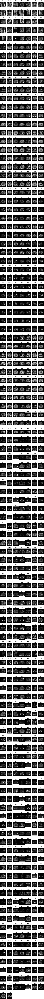

In [26]:
def visualize_dicom_images_for_patient(dicom_files, target_patient_id, num_images=100):
    # Filter files based on the target patient ID in the folder path
    filtered_files = [file for file in dicom_files if f"/{target_patient_id}/" in file]
    
    axial_files = []
    for dicom_file in filtered_files:
        try:
            dataset = pydicom.dcmread(dicom_file)
            # Check if the image is axial based on ImageOrientationPatient
            if hasattr(dataset, 'ImageOrientationPatient'):
                orientation = dataset.ImageOrientationPatient
                #if np.allclose(orientation, [1, 0, 0, 0, 1, 0], atol=1e-2):  # Axial check
                axial_files.append(dicom_file)
        except Exception as e:
            print(f"Error reading {dicom_file}: {e}")

    # Sort files numerically by their basename
    axial_files.sort(key=lambda x: int(os.path.splitext(os.path.basename(x))[0]))
    
    # Limit to num_images
    axial_files = axial_files[:num_images]
    
    if not axial_files:
        print(f"No axial DICOM files found for patient ID {target_patient_id}.")
        return
    
    # Set maximum images per row
    images_per_row = 7
    total_rows = int(np.ceil(len(axial_files) / images_per_row))
    
    # Plot the images
    plt.figure(figsize=(images_per_row * 1.5, total_rows * 2))
    for i, dicom_file in enumerate(axial_files):
        dataset = pydicom.dcmread(dicom_file)
        plt.subplot(total_rows, images_per_row, i + 1)
        plt.imshow(dataset.pixel_array, cmap='gray')
        plt.title(f"{target_patient_id}\n{os.path.basename(dicom_file)}", fontsize=8)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Define the path to the DICOM folder and patient ID
dicom_folder = "/gpfs/data/mankowskilab/HCC_Recurrence/dicom/"
target_patient_id = "9023679"

# Gather all DICOM files in the directory (recursively, if needed)
dicom_files = [
    os.path.join(root, file)
    for root, _, files in os.walk(dicom_folder)
    for file in files if file.endswith(('.dcm', '.dicom'))
]

# Visualize only axial images for patient ID 9023679
visualize_dicom_images_for_patient(dicom_files, target_patient_id, num_images=1000)


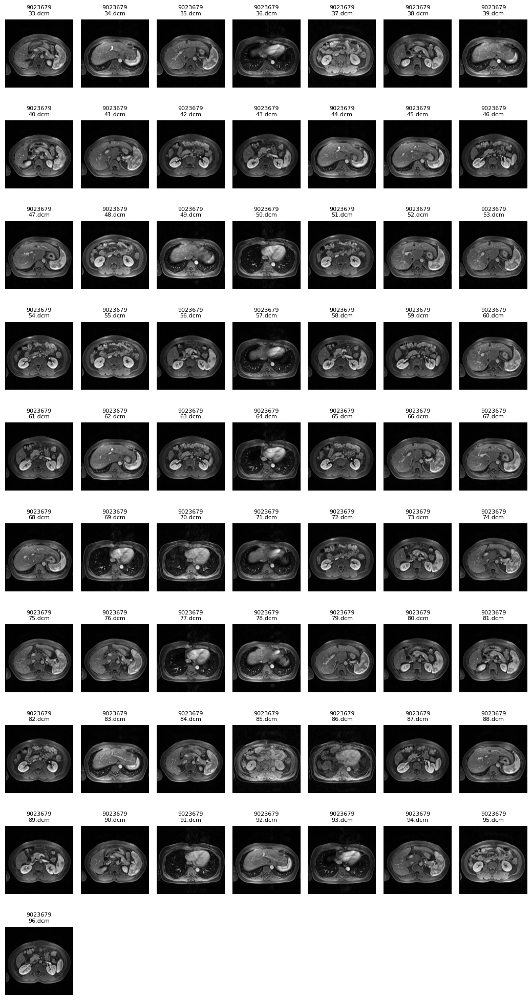

In [31]:
def visualize_dicom_images_for_patient(dicom_files, target_patient_id, target_series_time, num_images=100):
    # Filter files based on the target patient ID in the folder path
    filtered_files = [file for file in dicom_files if f"/{target_patient_id}/" in file]
    
    axial_files = []
    for dicom_file in filtered_files:
        try:
            dataset = pydicom.dcmread(dicom_file)
            # Check if the image matches the target series time
            if dataset.get("SeriesTime", "Unknown") == target_series_time:
                # Check if the image is axial based on ImageOrientationPatient
                if hasattr(dataset, 'ImageOrientationPatient'):
                    orientation = dataset.ImageOrientationPatient
                    # Add axial files to the list
                    axial_files.append(dicom_file)
        except Exception as e:
            print(f"Error reading {dicom_file}: {e}")

    # Sort files numerically by their basename
    axial_files.sort(key=lambda x: int(os.path.splitext(os.path.basename(x))[0]))
    
    # Limit to num_images
    axial_files = axial_files[:num_images]
    
    if not axial_files:
        print(f"No axial DICOM files found for patient ID {target_patient_id} with SeriesTime {target_series_time}.")
        return
    
    # Set maximum images per row
    images_per_row = 7
    total_rows = int(np.ceil(len(axial_files) / images_per_row))
    
    # Plot the images
    plt.figure(figsize=(images_per_row * 1.5, total_rows * 2))
    for i, dicom_file in enumerate(axial_files):
        dataset = pydicom.dcmread(dicom_file)
        plt.subplot(total_rows, images_per_row, i + 1)
        plt.imshow(dataset.pixel_array, cmap='gray')
        plt.title(f"{target_patient_id}\n{os.path.basename(dicom_file)}", fontsize=8)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Define the path to the DICOM folder and patient ID
dicom_folder = "/gpfs/data/mankowskilab/HCC_Recurrence/dicom/"
target_patient_id = "9023679"
target_series_time = "092208.156000"  # Example SeriesTime to filter by

# Gather all DICOM files in the directory (recursively, if needed)
dicom_files = [
    os.path.join(root, file)
    for root, _, files in os.walk(dicom_folder)
    for file in files if file.endswith(('.dcm', '.dicom'))
]

# Visualize only axial images for the specified patient ID and SeriesTime
visualize_dicom_images_for_patient(dicom_files, target_patient_id, target_series_time, num_images=1000)


In [30]:
dicom_folder = "/gpfs/data/mankowskilab/HCC_Recurrence/dicom/9023679"
dicom_files = [
    os.path.join(root, file)
    for root, _, files in os.walk(dicom_folder)
    for file in files if file.endswith(('.dcm', '.dicom'))
]
def save_stats(stats, output_file):
    pd.DataFrame.from_dict(stats, orient='index').to_csv(output_file)

def get_dataset_stats(dicom_files):
    # Metrics dictionaries
    stats = {
        "modalities": defaultdict(int),
        "dimensions": defaultdict(int),
        "manufacturers": defaultdict(int),
        "body_parts": defaultdict(int),
        "slice_thickness": defaultdict(int),
        "pixel_spacing": defaultdict(int),
        "magnetic_field_strength": defaultdict(int),
        "study_dates": defaultdict(int),
        "series_dates": defaultdict(int),
        "acquisition_dates": defaultdict(int),
        "content_dates": defaultdict(int),
        "study_times": defaultdict(int),
        "series_times": defaultdict(int),
        "acquisition_times": defaultdict(int),
        "patient_age": defaultdict(int),
        "patient_sex": defaultdict(int),
        "number_of_frames": defaultdict(int),
        "orientation": defaultdict(int),  # New statistic for orientation
    }

    def process_file(dicom_file):
        dataset = pydicom.dcmread(dicom_file)

        # Extract attributes
        modality = dataset.get("Modality", "Unknown")
        dimensions_key = (dataset.Rows, dataset.Columns) if "Rows" in dataset and "Columns" in dataset else "Unknown"
        manufacturer = dataset.get("Manufacturer", "Unknown")
        body_part = dataset.get("BodyPartExamined", "Unknown")
        slice_thickness = dataset.get("SliceThickness", "Unknown")
        pixel_spacing = tuple(dataset.get("PixelSpacing", ["Unknown", "Unknown"]))
        magnetic_field = dataset.get("MagneticFieldStrength", "Unknown")
        study_date = dataset.get("StudyDate", "Unknown")
        series_date = dataset.get("SeriesDate", "Unknown")
        acquisition_date = dataset.get("AcquisitionDate", "Unknown")
        content_date = dataset.get("ContentDate", "Unknown")
        study_time = dataset.get("StudyTime", "Unknown")
        series_time = dataset.get("SeriesTime", "Unknown")
        acquisition_time = dataset.get("AcquisitionTime", "Unknown")
        patient_age = dataset.get("PatientAge", "Unknown")
        patient_sex = dataset.get("PatientSex", "Unknown")
        number_of_frames = dataset.get("NumberOfFrames", 1)  # Default to 1 if not multi-frame
        orientation = tuple(dataset.get("ImageOrientationPatient", ["Unknown"] * 6))  # Extract orientation

        return {
            "modality": modality,
            "dimensions_key": dimensions_key,
            "manufacturer": manufacturer,
            "body_part": body_part,
            "slice_thickness": slice_thickness,
            "pixel_spacing": pixel_spacing,
            "magnetic_field_strength": magnetic_field,
            "study_date": study_date,
            "series_date": series_date,
            "acquisition_date": acquisition_date,
            "content_date": content_date,
            "study_time": study_time,
            "series_time": series_time,
            "acquisition_time": acquisition_time,
            "patient_age": patient_age,
            "patient_sex": patient_sex,
            "number_of_frames": number_of_frames,
            "orientation": orientation,
        }

    # Process files in parallel
    with ThreadPoolExecutor() as executor:
        results = list(
            tqdm(executor.map(process_file, dicom_files), total=len(dicom_files), desc="Processing DICOM files")
        )

    # Aggregate statistics
    for result in results:
        stats["modalities"][result["modality"]] += 1
        stats["dimensions"][result["dimensions_key"]] += 1
        stats["manufacturers"][result["manufacturer"]] += 1
        stats["body_parts"][result["body_part"]] += 1
        stats["slice_thickness"][result["slice_thickness"]] += 1
        stats["pixel_spacing"][result["pixel_spacing"]] += 1
        stats["magnetic_field_strength"][result["magnetic_field_strength"]] += 1
        stats["study_dates"][result["study_date"]] += 1
        stats["series_dates"][result["series_date"]] += 1
        stats["acquisition_dates"][result["acquisition_date"]] += 1
        stats["content_dates"][result["content_date"]] += 1
        stats["study_times"][result["study_time"]] += 1
        stats["series_times"][result["series_time"]] += 1
        stats["acquisition_times"][result["acquisition_time"]] += 1
        stats["patient_age"][result["patient_age"]] += 1
        stats["patient_sex"][result["patient_sex"]] += 1
        stats["number_of_frames"][result["number_of_frames"]] += 1
        stats["orientation"][result["orientation"]] += 1

    return stats

# Updated display function
def display_stats(stats):
    def print_distribution(title, distribution):
        print(f"\n{title}:")
        total = sum(distribution.values())
        for key, count in sorted(distribution.items(), key=lambda x: x[1], reverse=True):
            percentage = (count / total) * 100
            print(f"  {key}: {count} images ({percentage:.2f}%)")

    print_distribution("Modality distribution", stats["modalities"])
    print_distribution("Image dimensions distribution", stats["dimensions"])
    print_distribution("Manufacturer distribution", stats["manufacturers"])
    print_distribution("Body parts examined distribution", stats["body_parts"])
    print_distribution("Slice thickness distribution", stats["slice_thickness"])
    print_distribution("Pixel spacing distribution", stats["pixel_spacing"])
    print_distribution("Magnetic field strength distribution", stats["magnetic_field_strength"])
    print_distribution("Study dates distribution", stats["study_dates"])
    print_distribution("Series dates distribution", stats["series_dates"])
    print_distribution("Acquisition dates distribution", stats["acquisition_dates"])
    print_distribution("Content dates distribution", stats["content_dates"])
    print_distribution("Study times distribution", stats["study_times"])
    print_distribution("Series times distribution", stats["series_times"])
    print_distribution("Acquisition times distribution", stats["acquisition_times"])
    print_distribution("Patient age distribution", stats["patient_age"])
    print_distribution("Patient sex distribution", stats["patient_sex"])
    print_distribution("Number of frames distribution", stats["number_of_frames"])
    print_distribution("Orientation distribution", stats["orientation"])

# Example usage
stats = get_dataset_stats(dicom_files)
display_stats(stats)


# Optionally save statistics
#save_stats(stats, "dicom_dataset_stats.csv")


Processing DICOM files: 100%|██████████| 814/814 [00:01<00:00, 646.86it/s]


Modality distribution:
  MR: 814 images (100.00%)

Image dimensions distribution:
  (256, 256): 636 images (78.13%)
  (288, 384): 80 images (9.83%)
  (224, 256): 42 images (5.16%)
  (240, 256): 34 images (4.18%)
  (128, 128): 22 images (2.70%)

Manufacturer distribution:
  SIEMENS: 814 images (100.00%)

Body parts examined distribution:
  : 814 images (100.00%)

Slice thickness distribution:
  3: 564 images (69.29%)
  8: 120 images (14.74%)
  10: 56 images (6.88%)
  4: 42 images (5.16%)
  6: 32 images (3.93%)

Pixel spacing distribution:
  ('1.26953125', '1.26953125'): 646 images (79.36%)
  ('0.91145831346512', '0.91145831346512'): 80 images (9.83%)
  ('1.3671875', '1.3671875'): 66 images (8.11%)
  ('3.90625', '3.90625'): 22 images (2.70%)

Magnetic field strength distribution:
  1.5: 814 images (100.00%)

Study dates distribution:
  20140521: 814 images (100.00%)

Series dates distribution:
  20140521: 814 images (100.00%)

Acquisition dates distribution:
  20140521: 814 images (100.

In [32]:
# Path to the DICOM file
import pandas as pd
dicom_path = '/gpfs/data/mankowskilab/HCC_Recurrence/dicom/9023679/1.dcm'

# Read the DICOM file
dicom_data = pydicom.dcmread(dicom_path)

# Extract all information from the DICOM file
dicom_info = {elem.keyword: elem.value for elem in dicom_data if elem.keyword}
dicom_info_df = pd.DataFrame(dicom_info.items(), columns=['Attribute', 'Value'])



In [39]:
#dicom_info

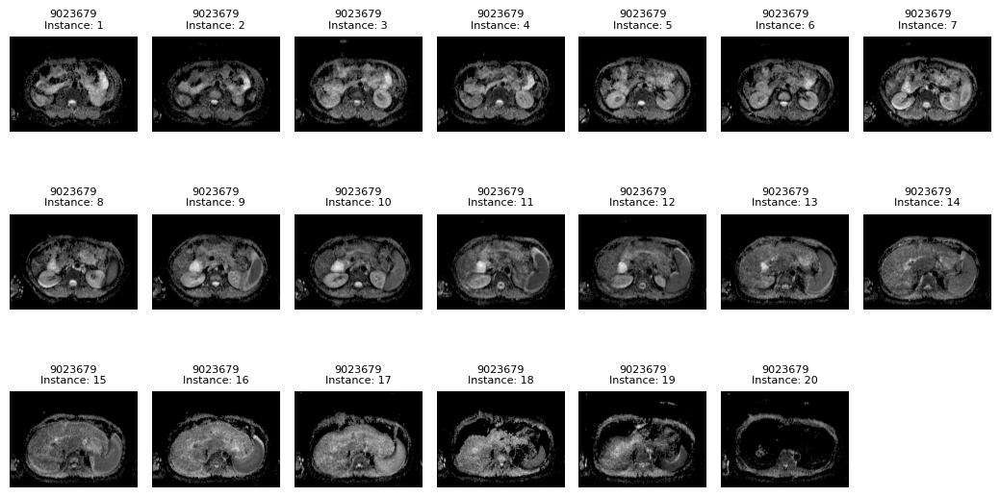

In [38]:
def visualize_dicom_images_for_patient(dicom_files, target_patient_id, target_series_time, num_images=100):
    # Filter files based on the target patient ID in the folder path
    filtered_files = [file for file in dicom_files if f"/{target_patient_id}/" in file]
    
    axial_files = []
    file_instance_mapping = []
    
    for dicom_file in filtered_files:
        try:
            dataset = pydicom.dcmread(dicom_file)
            # Check if the image matches the target series time
            if dataset.get("SeriesTime", "Unknown") == target_series_time:
                # Check if the image is axial based on ImageOrientationPatient
                if hasattr(dataset, 'ImageOrientationPatient'):
                    orientation = dataset.ImageOrientationPatient
                    # Add file and instance number for sorting
                    instance_number = dataset.get("InstanceNumber", float('inf'))  # Use 'inf' for missing InstanceNumber
                    file_instance_mapping.append((dicom_file, instance_number))
        except Exception as e:
            print(f"Error reading {dicom_file}: {e}")

    # Sort files by InstanceNumber
    file_instance_mapping.sort(key=lambda x: x[1])
    axial_files = [file for file, _ in file_instance_mapping]

    # Limit to num_images
    axial_files = axial_files[:num_images]

    if not axial_files:
        print(f"No axial DICOM files found for patient ID {target_patient_id} with SeriesTime {target_series_time}.")
        return

    # Set maximum images per row
    images_per_row = 7
    total_rows = int(np.ceil(len(axial_files) / images_per_row))
    
    # Plot the images
    plt.figure(figsize=(images_per_row * 1.5, total_rows * 2))
    for i, dicom_file in enumerate(axial_files):
        dataset = pydicom.dcmread(dicom_file)
        plt.subplot(total_rows, images_per_row, i + 1)
        plt.imshow(dataset.pixel_array, cmap='gray')
        plt.title(f"{target_patient_id}\nInstance: {dataset.get('InstanceNumber', 'Unknown')}", fontsize=8)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Define the path to the DICOM folder and patient ID
dicom_folder = "/gpfs/data/mankowskilab/HCC_Recurrence/dicom/"
target_patient_id = "9023679"
target_series_time = "091842.437000"  # Example SeriesTime to filter by

# Gather all DICOM files in the directory (recursively, if needed)
dicom_files = [
    os.path.join(root, file)
    for root, _, files in os.walk(dicom_folder)
    for file in files if file.endswith(('.dcm', '.dicom'))
]

# Visualize only axial images for the specified patient ID and SeriesTime
visualize_dicom_images_for_patient(dicom_files, target_patient_id, target_series_time, num_images=1000)
